In [1]:
import ast
import glob
import json
import os
import shutil

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage
import torch
from IPython.core.interactiveshell import InteractiveShell
from sklearn.model_selection import GroupKFold, StratifiedGroupKFold
from tqdm import tqdm

InteractiveShell.ast_node_interactivity = "all"

In [2]:
df = pd.read_csv("/app/_data/full_train.csv")
df[["day", "slice"]] = df[["day", "slice"]].astype("int")

## segmentation for different classes

### dict with segmentation classes

In [3]:
list_classes = sorted(df["class"].unique().tolist())
classes = {list_classes[i]: i for i in range(len(list_classes))}
classes

{'large_bowel': 0, 'small_bowel': 1, 'stomach': 2}

In [4]:
with open("/app/_data/labels.json", "w") as f:
    json.dump(classes, f)

## group dataframe

In [5]:
train_df = df.pivot(index="id", columns="class", values="segmentation").reset_index(
    drop=False
)

In [6]:
train_df = train_df.merge(
    df[
        [
            "id",
            "case",
            "day",
            "slice",
            "path",
            "img_name",
            "height",
            "width",
            "pixel_height",
            "pixel_width",
        ]
    ].drop_duplicates(),
    on="id",
    how="left",
)

In [7]:
train_df[["day", "slice"]] = train_df[["day", "slice"]].astype("int")
train_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,path,img_name,height,width,pixel_height,pixel_width
0,case101_day20_slice_0001,NaN,NaN,NaN,case101,20,1,/app/_data/train/case101/case101_day20/scans/s...,slice_0001_266_266_1.50_1.50,266.0,266.0,1.5,1.5
1,case101_day20_slice_0002,NaN,NaN,NaN,case101,20,2,/app/_data/train/case101/case101_day20/scans/s...,slice_0002_266_266_1.50_1.50,266.0,266.0,1.5,1.5
2,case101_day20_slice_0003,NaN,NaN,NaN,case101,20,3,/app/_data/train/case101/case101_day20/scans/s...,slice_0003_266_266_1.50_1.50,266.0,266.0,1.5,1.5
3,case101_day20_slice_0004,NaN,NaN,NaN,case101,20,4,/app/_data/train/case101/case101_day20/scans/s...,slice_0004_266_266_1.50_1.50,266.0,266.0,1.5,1.5
4,case101_day20_slice_0005,NaN,NaN,NaN,case101,20,5,/app/_data/train/case101/case101_day20/scans/s...,slice_0005_266_266_1.50_1.50,266.0,266.0,1.5,1.5


## find previous slices

In [8]:
train_df = train_df.sort_values("id").reset_index(drop=True)
for i in range(1, 7):
    train_df[f"id_{i}"] = train_df.groupby(["case", "day"])["id"].shift(i)

In [9]:
train_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,path,img_name,height,width,pixel_height,pixel_width,id_1,id_2,id_3,id_4,id_5,id_6
0,case101_day20_slice_0001,NaN,NaN,NaN,case101,20,1,/app/_data/train/case101/case101_day20/scans/s...,slice_0001_266_266_1.50_1.50,266.0,266.0,1.5,1.5,NaN,NaN,NaN,NaN,NaN,NaN
1,case101_day20_slice_0002,NaN,NaN,NaN,case101,20,2,/app/_data/train/case101/case101_day20/scans/s...,slice_0002_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case101_day20_slice_0001,NaN,NaN,NaN,NaN,NaN
2,case101_day20_slice_0003,NaN,NaN,NaN,case101,20,3,/app/_data/train/case101/case101_day20/scans/s...,slice_0003_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case101_day20_slice_0002,case101_day20_slice_0001,NaN,NaN,NaN,NaN
3,case101_day20_slice_0004,NaN,NaN,NaN,case101,20,4,/app/_data/train/case101/case101_day20/scans/s...,slice_0004_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case101_day20_slice_0003,case101_day20_slice_0002,case101_day20_slice_0001,NaN,NaN,NaN
4,case101_day20_slice_0005,NaN,NaN,NaN,case101,20,5,/app/_data/train/case101/case101_day20/scans/s...,slice_0005_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case101_day20_slice_0004,case101_day20_slice_0003,case101_day20_slice_0002,case101_day20_slice_0001,NaN,NaN


In [10]:
train_df[train_df["case"] == "case81"].head(10)

,id,large_bowel,small_bowel,stomach,case,day,slice,path,img_name,height,width,pixel_height,pixel_width,id_1,id_2,id_3,id_4,id_5,id_6
34672,case81_day0_slice_0001,NaN,NaN,NaN,case81,0,1,/app/_data/train/case81/case81_day0/scans/slic...,slice_0001_266_266_1.50_1.50,266.0,266.0,1.5,1.5,NaN,NaN,NaN,NaN,NaN,NaN
34673,case81_day0_slice_0002,NaN,NaN,NaN,case81,0,2,/app/_data/train/case81/case81_day0/scans/slic...,slice_0002_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case81_day0_slice_0001,NaN,NaN,NaN,NaN,NaN
34674,case81_day0_slice_0003,NaN,NaN,NaN,case81,0,3,/app/_data/train/case81/case81_day0/scans/slic...,slice_0003_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case81_day0_slice_0002,case81_day0_slice_0001,NaN,NaN,NaN,NaN
34675,case81_day0_slice_0004,NaN,NaN,NaN,case81,0,4,/app/_data/train/case81/case81_day0/scans/slic...,slice_0004_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case81_day0_slice_0003,case81_day0_slice_0002,case81_day0_slice_0001,NaN,NaN,NaN
34676,case81_day0_slice_0005,NaN,NaN,NaN,case81,0,5,/app/_data/train/case81/case81_day0/scans/slic...,slice_0005_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case81_day0_slice_0004,case81_day0_slice_0003,case81_day0_slice_0002,case81_day0_slice_0001,NaN,NaN
34677,case81_day0_slice_0006,NaN,NaN,NaN,case81,0,6,/app/_data/train/case81/case81_day0/scans/slic...,slice_0006_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case81_day0_slice_0005,case81_day0_slice_0004,case81_day0_slice_0003,case81_day0_slice_0002,case81_day0_slice_0001,NaN
34678,case81_day0_slice_0007,NaN,NaN,NaN,case81,0,7,/app/_data/train/case81/case81_day0/scans/slic...,slice_0007_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case81_day0_slice_0006,case81_day0_slice_0005,case81_day0_slice_0004,case81_day0_slice_0003,case81_day0_slice_0002,case81_day0_slice_0001
34679,case81_day0_slice_0008,NaN,NaN,NaN,case81,0,8,/app/_data/train/case81/case81_day0/scans/slic...,slice_0008_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case81_day0_slice_0007,case81_day0_slice_0006,case81_day0_slice_0005,case81_day0_slice_0004,case81_day0_slice_0003,case81_day0_slice_0002
34680,case81_day0_slice_0009,NaN,NaN,NaN,case81,0,9,/app/_data/train/case81/case81_day0/scans/slic...,slice_0009_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case81_day0_slice_0008,case81_day0_slice_0007,case81_day0_slice_0006,case81_day0_slice_0005,case81_day0_slice_0004,case81_day0_slice_0003
34681,case81_day0_slice_0010,NaN,NaN,NaN,case81,0,10,/app/_data/train/case81/case81_day0/scans/slic...,slice_0010_266_266_1.50_1.50,266.0,266.0,1.5,1.5,case81_day0_slice_0009,case81_day0_slice_0008,case81_day0_slice_0007,case81_day0_slice_0006,case81_day0_slice_0005,case81_day0_slice_0004


## save npy

In [8]:
def rle_decode(mask_array, img_shape):
    h, w = img_shape
    img_mask = np.zeros(h * w)
    rle_mask = np.array(mask_array.split(), dtype="int")
    starts = rle_mask[0::2] - 1
    ends = rle_mask[1::2] + starts
    for start, end in zip(starts, ends):
        img_mask[start:end] = 1
    return img_mask.reshape([h, w])

In [9]:
train_df["img_npy"] = "/app/_data/npy/imgs/" + train_df["id"] + ".npy"
train_df["mask_npy"] = "/app/_data/npy/masks/" + train_df["id"] + ".npy"
train_df["3Dnpy_s1"] = "/app/_data/3Dnpy_s1/" + train_df["id"] + ".npy"

In [10]:
train_df["is_mask"] = train_df[["large_bowel", "small_bowel", "stomach"]].any(1)

In [14]:
train_df.to_csv("/app/_data/train_main.csv", index=False)

In [15]:
for ix in tqdm(train_df.index):
    img = cv2.imread(train_df.loc[ix, "path"], cv2.IMREAD_UNCHANGED)
    img_name = train_df.loc[ix, "id"]
    rles = train_df.loc[ix, ["large_bowel", "small_bowel", "stomach"]].values
    mask = np.zeros([img.shape[0], img.shape[1], 3])
    for n in range(3):
        if rles[n] == rles[n]:
            mask[:, :, n] = rle_decode(rles[n], img.shape[:2])
    np.save(f"/app/_data/npy/imgs/{img_name}", img)
    np.save(f"/app/_data/npy/masks/{img_name}", mask)

100% 38496/38496 [02:37<00:00, 244.33it/s]


## png to npy with masks and previous slices

### check if images of one case and day are the same size

In [16]:
case_day_df = (
    train_df.groupby(["case", "day"])[["height", "width"]]
    .agg(["min", "max"])
    .reset_index(drop=False)
)
case_day_df.columns = ["case", "day", "h_min", "h_max", "w_min", "w_max"]

In [17]:
case_day_df.query("h_min != h_max")

,case,day,h_min,h_max,w_min,w_max


In [18]:
case_day_df.query("w_min != w_max")

,case,day,h_min,h_max,w_min,w_max


All images during one day for the case are equal

In [19]:
def make_3d_npy(df, idx, back_step=1):
    npy_path, mask_path = df.loc[idx, ["img_npy", "mask_npy"]].values
    img_id = df.loc[idx, "id"]
    img = np.load(npy_path)
    mask = np.load(mask_path)
    cols = [f"id_{x}" for x in range(1, 2 * back_step + 1, back_step)]
    prev_ids = df.loc[idx, cols].values
    imgs = np.zeros([img.shape[0], img.shape[1], 3])
    imgs[:, :, 0] = img
    for k, p_id in enumerate(prev_ids):
        if p_id == p_id:
            pr_path = f"/app/_data/npy/imgs/{p_id}.npy"
            pr_img = np.load(pr_path)
            if pr_img.shape[:2] != img.shape[:2]:
                print(f"Shape of {img_id} previous images are not equal")
                pr_img = cv2.resize(pr_img, img.size[:2])
            imgs[:, :, k + 1] = pr_img
    return np.dstack([imgs, mask])

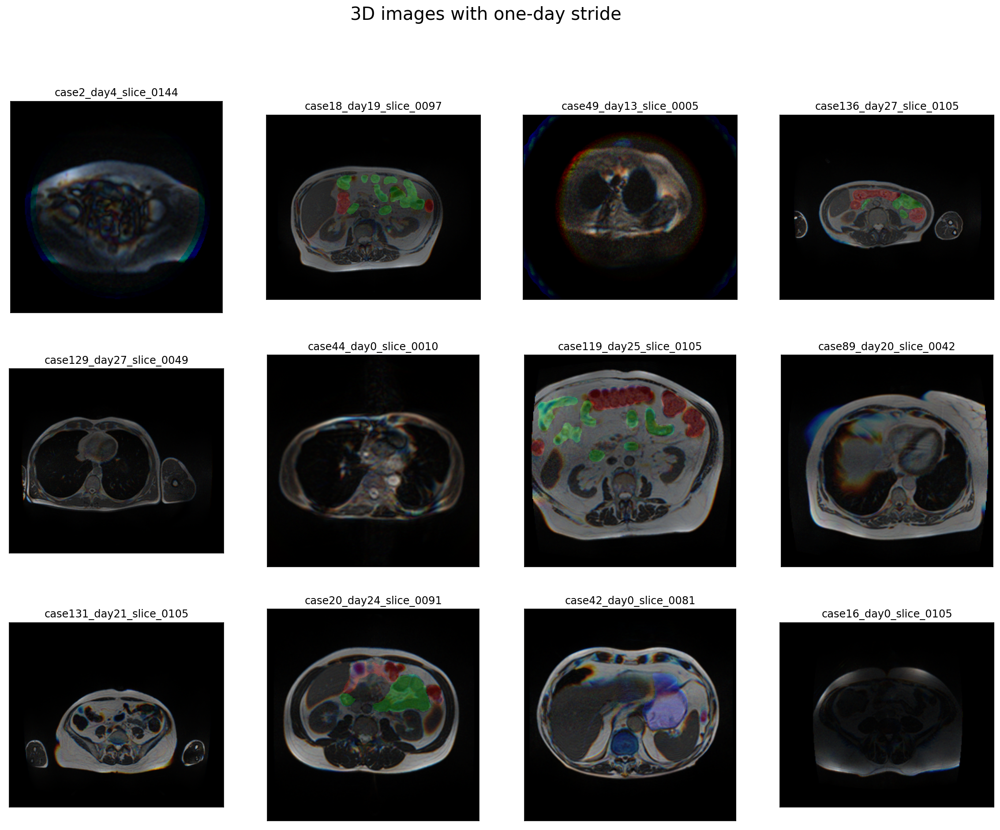

In [20]:
plt.figure(figsize=(20, 15))
plt.suptitle("3D images with one-day stride", fontsize=20)
for i in range(12):
    ix = train_df.index[np.random.randint(train_df.index.shape[0])]
    img = make_3d_npy(train_df, ix, 1)
    plt.subplot(3, 4, i + 1)
    plt.title(train_df.loc[ix, "id"])
    plt.imshow(img[:, :, :-3] / img.max())
    plt.imshow(img[:, :, -3:], alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

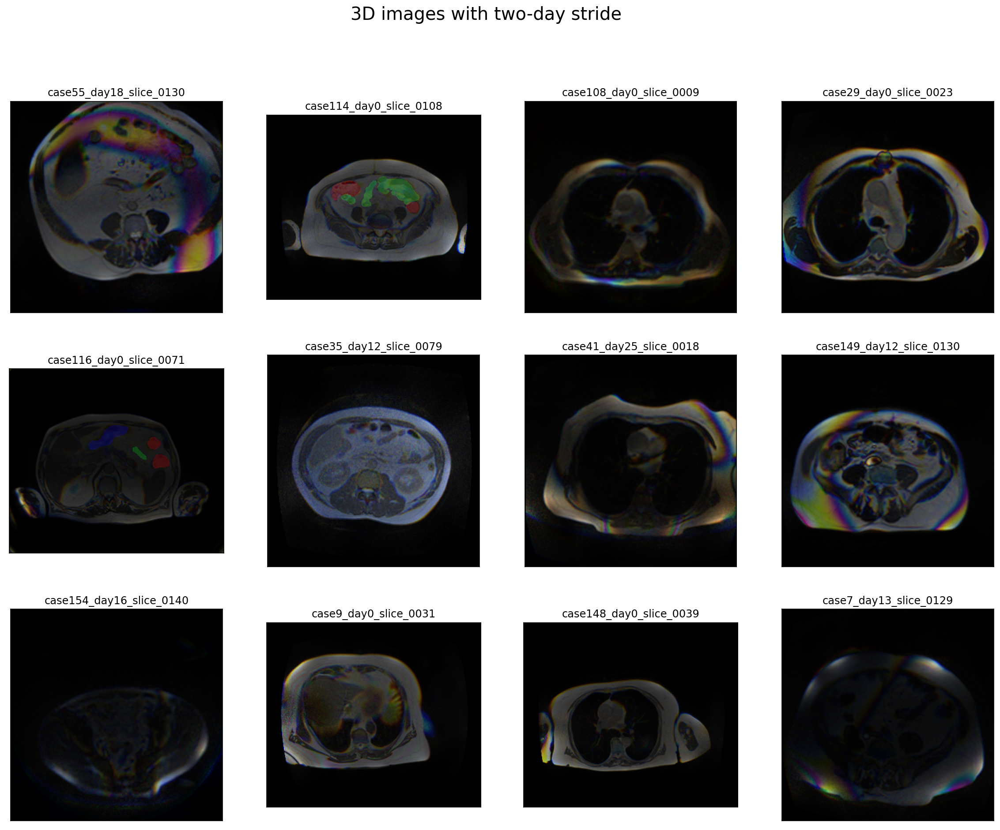

In [21]:
plt.figure(figsize=(20, 15))
plt.suptitle("3D images with two-day stride", fontsize=20)
for i in range(12):
    ix = train_df.index[np.random.randint(train_df.index.shape[0])]
    img = make_3d_npy(train_df, ix, 2)
    plt.subplot(3, 4, i + 1)
    plt.title(train_df.loc[ix, "id"])
    plt.imshow(img[:, :, :-3] / img.max())
    plt.imshow(img[:, :, -3:], alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

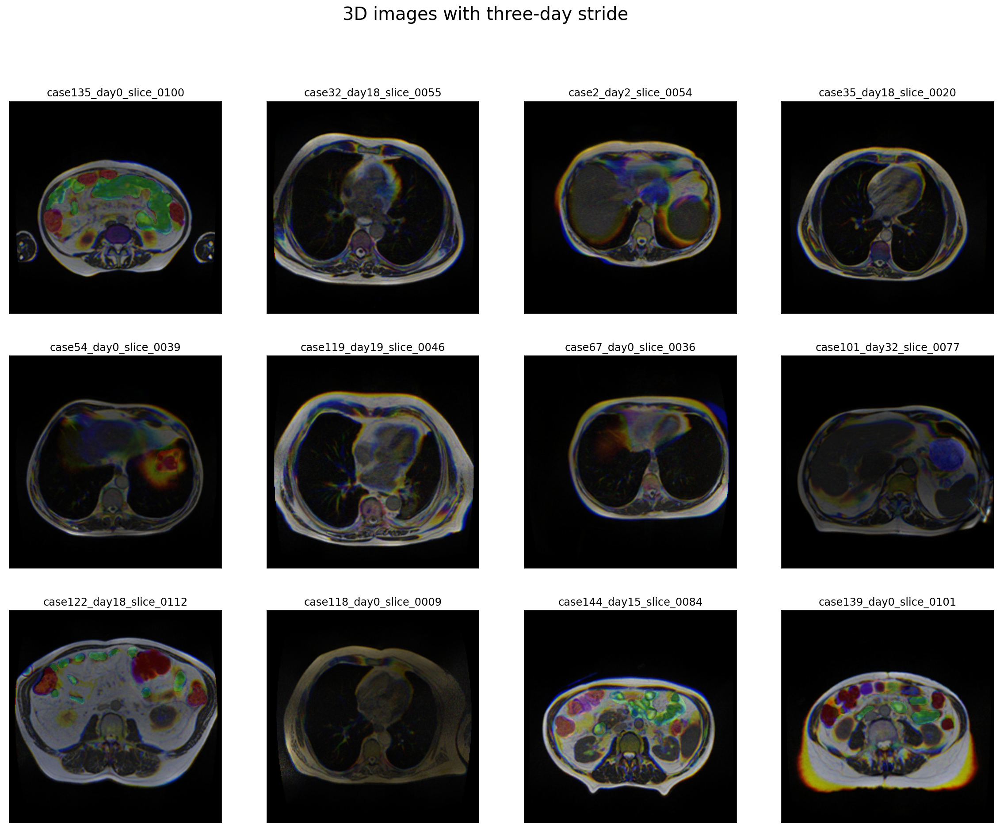

In [22]:
plt.figure(figsize=(20, 15))
plt.suptitle("3D images with three-day stride", fontsize=20)
for i in range(12):
    ix = train_df.index[np.random.randint(train_df.index.shape[0])]
    img = make_3d_npy(train_df, ix, 3)
    plt.subplot(3, 4, i + 1)
    plt.title(train_df.loc[ix, "id"])
    plt.imshow(img[:, :, :-3] / img.max())
    plt.imshow(img[:, :, -3:], alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

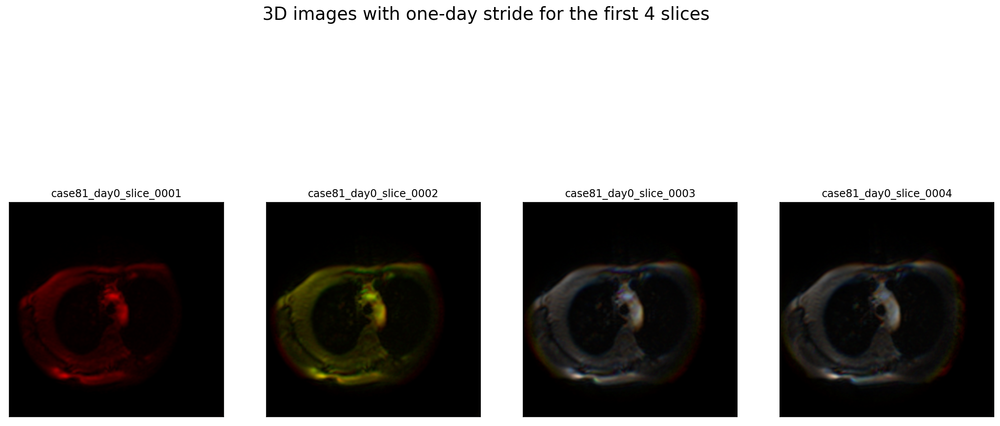

In [23]:
plt.figure(figsize=(20, 10))
plt.suptitle("3D images with one-day stride for the first 4 slices", fontsize=20)
for i in range(4):
    ix = train_df.query('case == "case81"').index[0] + i
    img = make_3d_npy(train_df, ix, 1)
    plt.subplot(1, 4, i + 1)
    plt.title(train_df.loc[ix, "id"])
    plt.imshow(img[:, :, :-3] / img.max())
    plt.imshow(img[:, :, -3:], alpha=0.2)
    plt.xticks([])
    plt.yticks([])
plt.show();

In [24]:
for ix in tqdm(train_df.index):
    img = make_3d_npy(train_df, ix, 1)
    img_name = train_df.loc[ix, "id"]
    np.save(f"/app/_data/3Dnpy_s1/{img_name}", img)

100% 38496/38496 [04:56<00:00, 129.91it/s]


## train/test split

In [25]:
df = pd.read_csv("/app/_data/train_main.csv")

In [26]:
gkf = StratifiedGroupKFold(n_splits=6, shuffle=True, random_state=42)

In [27]:
for n, (train_ixs, val_ix) in enumerate(
    gkf.split(
        X=df,
        y=df["is_mask"],
        groups=df["case"],
    )
):
    df.loc[val_ix, "fold"] = n

In [29]:
for fold in range(6):
    print(f"Proportion of images with mask and without in  fold #{int(fold)}")
    df[df["fold"] != fold][["is_mask"]].sum() / df[df["fold"] == fold][
        ["is_mask"]
    ].sum()

Proportion of images with mask and without in  fold #0


is_mask    4.671795
dtype: float64

Proportion of images with mask and without in  fold #1


is_mask    5.697618
dtype: float64

Proportion of images with mask and without in  fold #2


is_mask    5.801968
dtype: float64

Proportion of images with mask and without in  fold #3


is_mask    5.727494
dtype: float64

Proportion of images with mask and without in  fold #4


is_mask    4.006035
dtype: float64

Proportion of images with mask and without in  fold #5


is_mask    4.58774
dtype: float64

In [30]:
df.to_csv("/app/_data/folds.csv", index=False)

In [35]:
df[df["is_mask"]]["slice"].describe()

count    16590.000000
mean        82.440687
std         22.098025
min          2.000000
25%         66.000000
50%         84.000000
75%        100.000000
max        137.000000
Name: slice, dtype: float64

<AxesSubplot:>

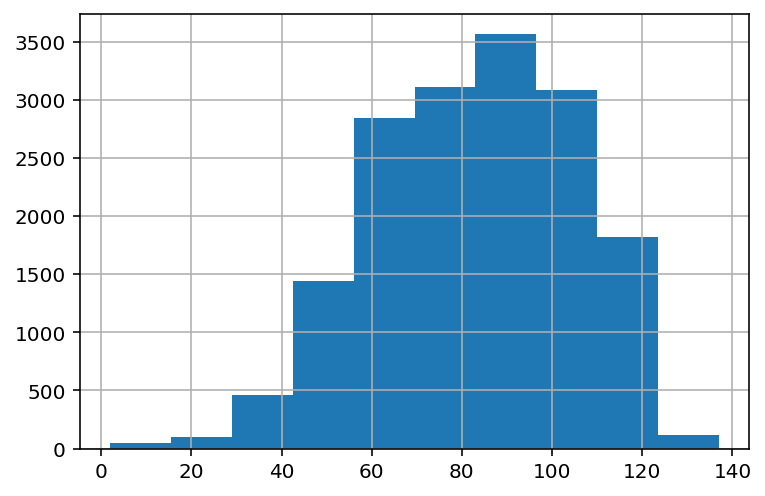

In [36]:
df[df["is_mask"]]["slice"].hist()

In [11]:
train_df

,id,large_bowel,small_bowel,stomach,case,day,slice,path,img_name,height,width,pixel_height,pixel_width,img_npy,mask_npy,3Dnpy_s1,is_mask
0,case101_day20_slice_0001,NaN,NaN,NaN,case101,20,1,/app/_data/train/case101/case101_day20/scans/s...,slice_0001_266_266_1.50_1.50,266.0,266.0,1.5,1.5,/app/_data/npy/imgs/case101_day20_slice_0001.npy,/app/_data/npy/masks/case101_day20_slice_0001.npy,/app/_data/3Dnpy_s1/case101_day20_slice_0001.npy,False
1,case101_day20_slice_0002,NaN,NaN,NaN,case101,20,2,/app/_data/train/case101/case101_day20/scans/s...,slice_0002_266_266_1.50_1.50,266.0,266.0,1.5,1.5,/app/_data/npy/imgs/case101_day20_slice_0002.npy,/app/_data/npy/masks/case101_day20_slice_0002.npy,/app/_data/3Dnpy_s1/case101_day20_slice_0002.npy,False
2,case101_day20_slice_0003,NaN,NaN,NaN,case101,20,3,/app/_data/train/case101/case101_day20/scans/s...,slice_0003_266_266_1.50_1.50,266.0,266.0,1.5,1.5,/app/_data/npy/imgs/case101_day20_slice_0003.npy,/app/_data/npy/masks/case101_day20_slice_0003.npy,/app/_data/3Dnpy_s1/case101_day20_slice_0003.npy,False
3,case101_day20_slice_0004,NaN,NaN,NaN,case101,20,4,/app/_data/train/case101/case101_day20/scans/s...,slice_0004_266_266_1.50_1.50,266.0,266.0,1.5,1.5,/app/_data/npy/imgs/case101_day20_slice_0004.npy,/app/_data/npy/masks/case101_day20_slice_0004.npy,/app/_data/3Dnpy_s1/case101_day20_slice_0004.npy,False
4,case101_day20_slice_0005,NaN,NaN,NaN,case101,20,5,/app/_data/train/case101/case101_day20/scans/s...,slice_0005_266_266_1.50_1.50,266.0,266.0,1.5,1.5,/app/_data/npy/imgs/case101_day20_slice_0005.npy,/app/_data/npy/masks/case101_day20_slice_0005.npy,/app/_data/3Dnpy_s1/case101_day20_slice_0005.npy,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38491,case9_day22_slice_0140,NaN,NaN,NaN,case9,22,140,/app/_data/train/case9/case9_day22/scans/slice...,slice_0140_360_310_1.50_1.50,310.0,360.0,1.5,1.5,/app/_data/npy/imgs/case9_day22_slice_0140.npy,/app/_data/npy/masks/case9_day22_slice_0140.npy,/app/_data/3Dnpy_s1/case9_day22_slice_0140.npy,False
38492,case9_day22_slice_0141,NaN,NaN,NaN,case9,22,141,/app/_data/train/case9/case9_day22/scans/slice...,slice_0141_360_310_1.50_1.50,310.0,360.0,1.5,1.5,/app/_data/npy/imgs/case9_day22_slice_0141.npy,/app/_data/npy/masks/case9_day22_slice_0141.npy,/app/_data/3Dnpy_s1/case9_day22_slice_0141.npy,False
38493,case9_day22_slice_0142,NaN,NaN,NaN,case9,22,142,/app/_data/train/case9/case9_day22/scans/slice...,slice_0142_360_310_1.50_1.50,310.0,360.0,1.5,1.5,/app/_data/npy/imgs/case9_day22_slice_0142.npy,/app/_data/npy/masks/case9_day22_slice_0142.npy,/app/_data/3Dnpy_s1/case9_day22_slice_0142.npy,False
38494,case9_day22_slice_0143,NaN,NaN,NaN,case9,22,143,/app/_data/train/case9/case9_day22/scans/slice...,slice_0143_360_310_1.50_1.50,310.0,360.0,1.5,1.5,/app/_data/npy/imgs/case9_day22_slice_0143.npy,/app/_data/npy/masks/case9_day22_slice_0143.npy,/app/_data/3Dnpy_s1/case9_day22_slice_0143.npy,False


In [16]:
train_df["img_npy"] = "/app/_data/npy/imgs/" + train_df["id"] + ".npy"
train_df["mask_npy"] = "/app/_data/npy/masks/" + train_df["id"] + ".npy"

In [150]:
def make_3d_symmetric_npy(df, ix, step=1):
    mask_path = df.loc[ix, "mask_npy"]
    img_id = df.loc[ix, "id"]
    mask = np.load(mask_path)

    cols = sorted([f"id_plus_{i}" for i in range(1, step + 1)], reverse=True)
    cols.append("id")
    cols.extend([f"id_minus_{i}" for i in range(1, step + 1)])
    imgs = np.zeros([mask.shape[0], mask.shape[1], step * 2 + 1])
    ids = df.loc[ix, cols].values
    for i in range(len(ids)):
        if ids[i] == ids[i]:
            path = f"/app/_data/npy/imgs/{ids[i]}.npy"
            img = np.load(path)
            imgs[:, :, i] = img
    return np.dstack([imgs, mask])

In [170]:
ix = 1
imgs = make_3d_symmetric_npy(df, ix, step=1)

In [171]:
imgs.shape

(266, 266, 6)

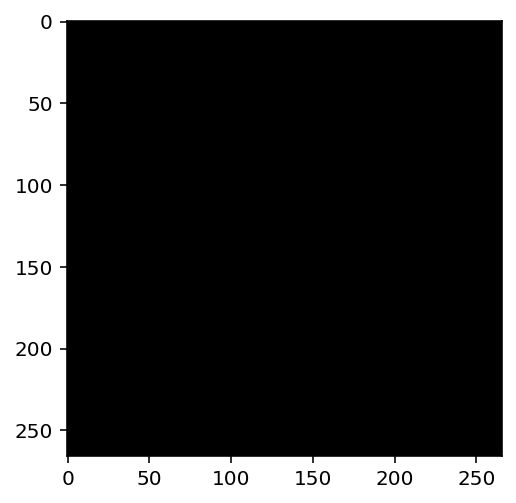

In [172]:
plt.imshow(imgs[:, :, -3:].astype("float32"))

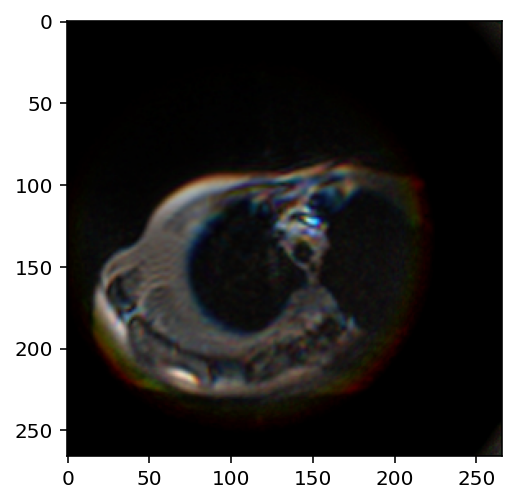

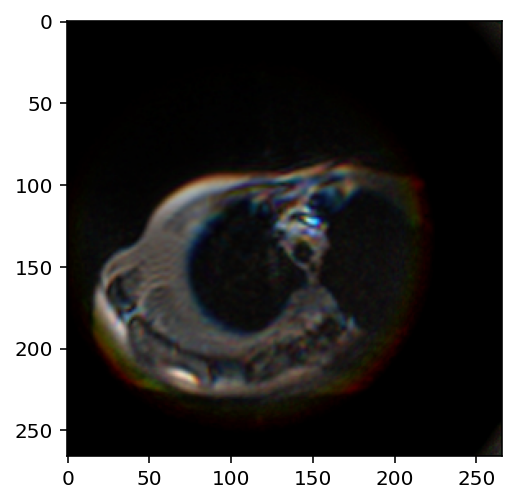

In [173]:
plt.imshow(imgs[:, :, :3] / imgs.max())
plt.show()
plt.imshow(imgs[:, :, :3] / imgs.max())

In [174]:
np.array_equal(imgs[:, :, 1], np.load(f"/app/_data/npy/imgs/{df.loc[ix, 'id']}.npy"))

True

In [176]:
path = "/app/_data/3D_npy_bf/"
for ix in tqdm(range(df.shape[0])):
    img = make_3d_symmetric_npy(df, ix, step=1)
    img_id = df.loc[ix, "id"]
    img_path = os.path.join(path, img_id + ".npy")
    np.save(img_path, img)

100% 38496/38496 [06:31<00:00, 98.32it/s] 


In [162]:
img_path

'/app/_data/5D_npy_bf/case101_day20_slice_0001.npy'

In [91]:
train_df = train_df.sort_values("id").reset_index(drop=True)
for i in range(1, 4):

    train_df[f"id_minus_{i}"] = train_df.groupby(["case", "day"])["id"].shift(i)
    train_df[f"id_plus_{i}"] = train_df.groupby(["case", "day"])["id"].shift(-i)

In [92]:
train_df

,id,large_bowel,small_bowel,stomach,case,day,slice,path,img_name,height,...,id_5,id_6,id_minus_1,id_plus_1,id_minus_2,id_plus_2,id_minus_3,id_plus_3,img_npy,mask_npy
0,case101_day20_slice_0001,NaN,NaN,NaN,case101,20,1,/app/_data/train/case101/case101_day20/scans/s...,slice_0001_266_266_1.50_1.50,266.0,...,NaN,NaN,NaN,case101_day20_slice_0002,NaN,case101_day20_slice_0003,NaN,case101_day20_slice_0004,/app/_data/npy/imgs/case101_day20_slice_0001.npy,/app/_data/npy/masks/case101_day20_slice_0001.npy
1,case101_day20_slice_0002,NaN,NaN,NaN,case101,20,2,/app/_data/train/case101/case101_day20/scans/s...,slice_0002_266_266_1.50_1.50,266.0,...,NaN,NaN,case101_day20_slice_0001,case101_day20_slice_0003,NaN,case101_day20_slice_0004,NaN,case101_day20_slice_0005,/app/_data/npy/imgs/case101_day20_slice_0002.npy,/app/_data/npy/masks/case101_day20_slice_0002.npy
2,case101_day20_slice_0003,NaN,NaN,NaN,case101,20,3,/app/_data/train/case101/case101_day20/scans/s...,slice_0003_266_266_1.50_1.50,266.0,...,NaN,NaN,case101_day20_slice_0002,case101_day20_slice_0004,case101_day20_slice_0001,case101_day20_slice_0005,NaN,case101_day20_slice_0006,/app/_data/npy/imgs/case101_day20_slice_0003.npy,/app/_data/npy/masks/case101_day20_slice_0003.npy
3,case101_day20_slice_0004,NaN,NaN,NaN,case101,20,4,/app/_data/train/case101/case101_day20/scans/s...,slice_0004_266_266_1.50_1.50,266.0,...,NaN,NaN,case101_day20_slice_0003,case101_day20_slice_0005,case101_day20_slice_0002,case101_day20_slice_0006,case101_day20_slice_0001,case101_day20_slice_0007,/app/_data/npy/imgs/case101_day20_slice_0004.npy,/app/_data/npy/masks/case101_day20_slice_0004.npy
4,case101_day20_slice_0005,NaN,NaN,NaN,case101,20,5,/app/_data/train/case101/case101_day20/scans/s...,slice_0005_266_266_1.50_1.50,266.0,...,NaN,NaN,case101_day20_slice_0004,case101_day20_slice_0006,case101_day20_slice_0003,case101_day20_slice_0007,case101_day20_slice_0002,case101_day20_slice_0008,/app/_data/npy/imgs/case101_day20_slice_0005.npy,/app/_data/npy/masks/case101_day20_slice_0005.npy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38491,case9_day22_slice_0140,NaN,NaN,NaN,case9,22,140,/app/_data/train/case9/case9_day22/scans/slice...,slice_0140_360_310_1.50_1.50,310.0,...,case9_day22_slice_0135,case9_day22_slice_0134,case9_day22_slice_0139,case9_day22_slice_0141,case9_day22_slice_0138,case9_day22_slice_0142,case9_day22_slice_0137,case9_day22_slice_0143,/app/_data/npy/imgs/case9_day22_slice_0140.npy,/app/_data/npy/masks/case9_day22_slice_0140.npy
38492,case9_day22_slice_0141,NaN,NaN,NaN,case9,22,141,/app/_data/train/case9/case9_day22/scans/slice...,slice_0141_360_310_1.50_1.50,310.0,...,case9_day22_slice_0136,case9_day22_slice_0135,case9_day22_slice_0140,case9_day22_slice_0142,case9_day22_slice_0139,case9_day22_slice_0143,case9_day22_slice_0138,case9_day22_slice_0144,/app/_data/npy/imgs/case9_day22_slice_0141.npy,/app/_data/npy/masks/case9_day22_slice_0141.npy
38493,case9_day22_slice_0142,NaN,NaN,NaN,case9,22,142,/app/_data/train/case9/case9_day22/scans/slice...,slice_0142_360_310_1.50_1.50,310.0,...,case9_day22_slice_0137,case9_day22_slice_0136,case9_day22_slice_0141,case9_day22_slice_0143,case9_day22_slice_0140,case9_day22_slice_0144,case9_day22_slice_0139,NaN,/app/_data/npy/imgs/case9_day22_slice_0142.npy,/app/_data/npy/masks/case9_day22_slice_0142.npy
38494,case9_day22_slice_0143,NaN,NaN,NaN,case9,22,143,/app/_data/train/case9/case9_day22/scans/slice...,slice_0143_360_310_1.50_1.50,310.0,...,case9_day22_slice_0138,case9_day22_slice_0137,case9_day22_slice_0142,case9_day22_slice_0144,case9_day22_slice_0141,NaN,case9_day22_slice_0140,NaN,/app/_data/npy/imgs/case9_day22_slice_0143.npy,/app/_data/npy/masks/case9_day22_slice_0143.npy
